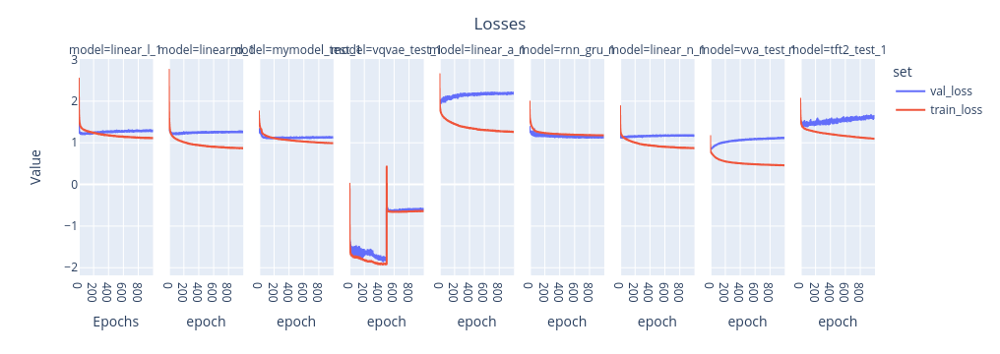

In [8]:
import plotly.express as px
import pandas as pd
import numpy as np
##Check the losses trend
tot_losses = pd.read_csv('/home/agobbi/Projects/ExpTS/weather/csv/prova_test_LOSSES.csv')
fig_losses = px.line(tot_losses,x = 'epoch',y='loss',color = 'set',facet_col='model',width = 2600)
fig_losses.update_layout(title = {'text':f'Losses', 'x':0.5},
                  xaxis_title={'text':'Epochs'},
                  yaxis_title={'text':'Value'},

                    )
    
fig_losses

In [10]:
tot_pred = pd.read_csv('/home/agobbi/Projects/ExpTS/weather/csv/prova_test_tot_predictions.csv')
tot_pred.sort_values(by='time',inplace=True)


In [11]:
tot_pred.model.unique()

array(['linear_l_1', 'vqvae_test_1', 'vva_test_1', 'mymodel_test_1',
       'linear_d_1', 'linear_n_1', 'persistent_persistent_1',
       'tft2_test_1', 'linear_a_1', 'rnn_gru_1'], dtype=object)

In [12]:
tot_pred.head()

,Unnamed: 0,lag,time,y,y_low,y_median,y_high,model,y_pred
0,0,1,2020-11-25 12:20:00,427.6,425.945465,429.065216,432.730286,linear_l_1,NaN
251472,251472,1,2020-11-25 12:20:00,427.6,NaN,NaN,NaN,vqvae_test_1,406.42694
586768,586768,1,2020-11-25 12:20:00,427.6,424.884360,429.866667,435.007928,vva_test_1,NaN
167648,167648,1,2020-11-25 12:20:00,427.6,426.281403,428.441559,429.620148,mymodel_test_1,NaN
83824,83824,1,2020-11-25 12:20:00,427.6,427.256958,427.956207,428.707581,linear_d_1,NaN


In [13]:
##some models does not give you the quantiles so, for seek of comparison, you can do this workaroud
tot_pred.y_pred[np.isnan(tot_pred.y_pred)] = tot_pred.y_median[np.isnan(tot_pred.y_pred)] 

/tmp/ipykernel_11044/3172030373.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



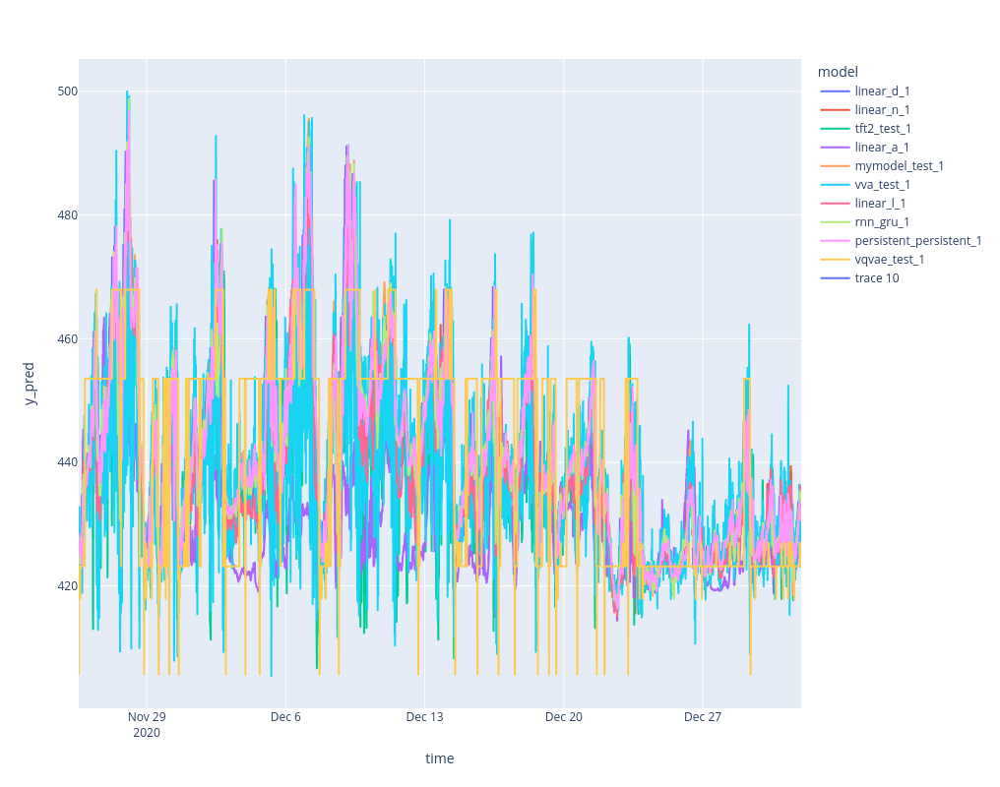

In [14]:
##let see how the prediction at step 10 are
lag=10

fig = px.line(tot_pred[(tot_pred.lag==lag)], x='time', y='y_pred', color='model',height=800)
fig.add_scatter(x = tot_pred[tot_pred.lag==lag].time, y=tot_pred[tot_pred.lag==lag].y)


In [16]:
import numpy as np
error = tot_pred.groupby(['lag','model']).apply(lambda x: np.nanmean((x.y-x.y_pred)**2)).reset_index().rename(columns={0:'error'}) 


In [17]:
import numpy as np
error = tot_pred.groupby(['lag','model']).apply(lambda x: 100*np.nanmean(np.abs(x.y-x.y_median)/x.y)).reset_index().rename(columns={0:'error'}) 


/tmp/ipykernel_11044/1376071945.py:2: RuntimeWarning:

Mean of empty slice



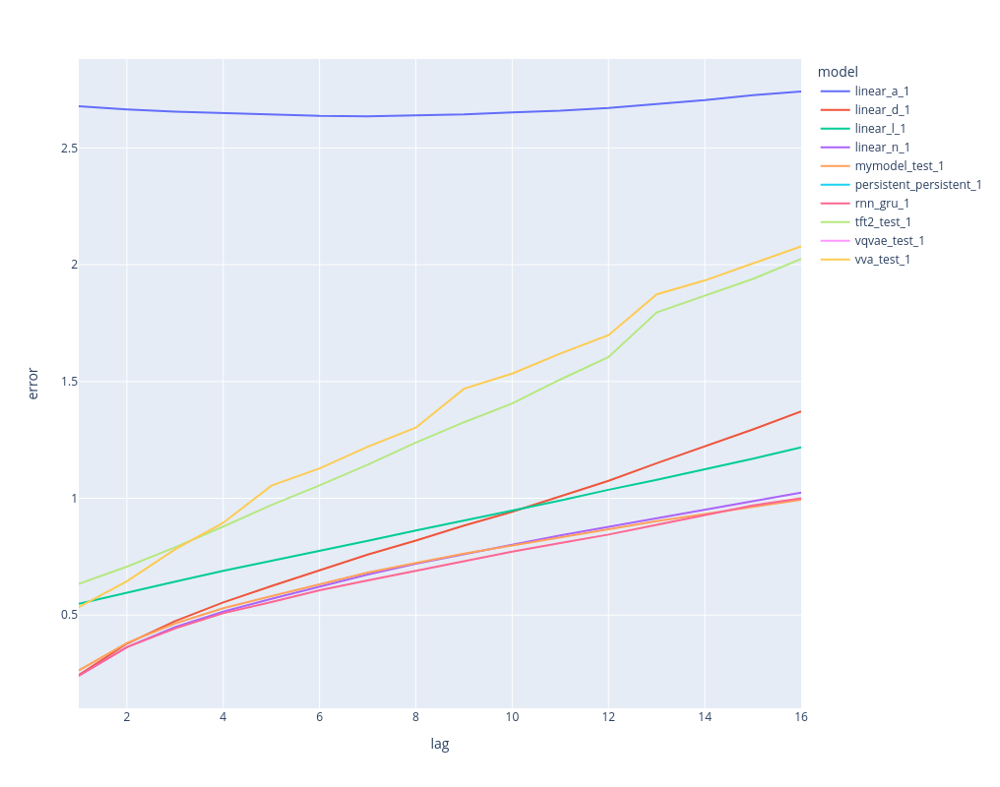

In [18]:
fig = px.line(error, x='lag', y='error', color='model',height=800)
fig.show()